In [1]:
import anndata as ad
import scanpy as sc
import gc
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
import scipy
import torch
import os

from scDisInFact import scdisinfact, create_scdisinfact_dataset

from metrics import calculate_metrics

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=300)
pd.set_option('display.max_columns', None)
seed = 10
np.random.seed(seed)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Unable to determine R library path: Command '('/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 127.


R_HOME is already set to: /vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R


/gpfs/gibbs/project/wang_zuoheng/xx244/Ndreamer/benchmark/metrics.py:29: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/pandas2ri.py:368: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/numpy2ri.py:241: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '


In [2]:
def run_scdisinfact(adata, batch_key, condition_key, dataset_name, cell_type_label=None):
    if np.max(adata.X) > 15:
        sc.pp.filter_cells(adata, min_genes=300)
        sc.pp.filter_genes(adata, min_cells=10)

        sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
        sc.pp.log1p(adata)

    if adata.shape[1] > 3000:
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, batch_key=batch_key)
        adata = adata[:, adata.var["highly_variable"]].copy()
    else:
        sc.pp.highly_variable_genes(adata, n_top_genes=adata.shape[1], batch_key=batch_key)

    import warnings

    # Suppress all warnings
    warnings.filterwarnings("ignore")

    result_dir = "./scd/" + dataset_name + "/"
    if not os.path.exists(result_dir):
        os.makedirs(result_dir)

    if isinstance(adata.X, scipy.sparse.spmatrix):
        adata.X = adata.X.toarray()

    counts = adata.X
    adata.obs["batch"] = adata.obs[batch_key].copy()
    meta_cells = adata.obs.copy()

    if isinstance(condition_key, str):
        condition_key = [condition_key]

    if not isinstance(condition_key, list):
        print("Wrong condition_key, must be string or list of string")

    data_dict = create_scdisinfact_dataset(counts, meta_cells, condition_key=condition_key, batch_key=batch_key, log_trans=False)

    # default setting of hyper-parameters
    reg_mmd_comm = 1e-4
    reg_mmd_diff = 1e-4
    reg_kl_comm = 1e-5
    reg_kl_diff = 1e-2
    reg_class = 1
    reg_gl = 1

    Ks = [8, 4]

    batch_size = 64
    nepochs = 100
    interval = 10
    lr = 5e-4
    lambs = [reg_mmd_comm, reg_mmd_diff, reg_kl_comm, reg_kl_diff, reg_class, reg_gl]
    model = scdisinfact(data_dict=data_dict, Ks=Ks, batch_size=batch_size, interval=interval, lr=lr,
                        reg_mmd_comm=reg_mmd_comm, reg_mmd_diff=reg_mmd_diff, reg_gl=reg_gl, reg_class=reg_class,
                        reg_kl_comm=reg_kl_comm, reg_kl_diff=reg_kl_diff, seed=0, device=device)
    model.train()
    losses = model.train_model(nepochs=nepochs, recon_loss="NB")
    torch.save(model.state_dict(), result_dir + f"model_{Ks}_{lambs}_{batch_size}_{nepochs}_{lr}.pth")
    model.load_state_dict(
        torch.load(result_dir + f"model_{Ks}_{lambs}_{batch_size}_{nepochs}_{lr}.pth", map_location=device))
    _ = model.eval()

    # one forward pass
    z_cs = []
    z_ds = []
    zs = []

    for dataset in data_dict["datasets"]:
        with torch.no_grad():
            # pass through the encoders
            dict_inf = model.inference(counts=dataset.counts_norm.to(model.device),
                                       batch_ids=dataset.batch_id[:, None].to(model.device), print_stat=True)
            # pass through the decoder
            dict_gen = model.generative(z_c=dict_inf["mu_c"], z_d=dict_inf["mu_d"],
                                        batch_ids=dataset.batch_id[:, None].to(model.device))
            z_c = dict_inf["mu_c"]
            z_d = dict_inf["mu_d"]
            z = torch.cat([z_c] + z_d, dim=1)
            mu = dict_gen["mu"]
            z_ds.append([x.cpu().detach().numpy() for x in z_d])
            z_cs.append(z_c.cpu().detach().numpy())
            zs.append(np.concatenate([z_cs[-1]] + z_ds[-1], axis=1))

    latent = np.concatenate(z_cs, axis=0)
    meta_dict = {}
    for namei in meta_cells.columns.tolist():
        meta_dict[namei] = np.concatenate([x[namei].values for x in data_dict["meta_cells"]])

    meta_df = pd.DataFrame(meta_dict)
    adata_latent = ad.AnnData(X=counts)
    adata_latent.var_names = adata.var_names
    adata_latent.obs = meta_df

    denoised_counts = model.predict_counts(input_counts=counts, meta_cells=meta_cells, condition_keys=condition_key,
                                           batch_key=batch_key, predict_conds=None, predict_batch=None)
    # adata.obsm["denoised"] = denoised_counts
    adata.layers["denoised"] = denoised_counts
    adata.obsm['main_effect'] = latent

    adata.write_h5ad("./scd/" + dataset_name + "_latent.h5ad")

    sc.pp.neighbors(adata_latent, n_neighbors=15, n_pcs=50)
    sc.tl.umap(adata_latent)
    sc.pl.umap(adata_latent, color=condition_key, ncols=1)
    sc.pl.umap(adata_latent, color=batch_key, ncols=1)
    if cell_type_label is not None:
        sc.pl.umap(adata_latent, color=cell_type_label)

# (EC)CITE-seq

https://www.nature.com/articles/s41588-021-00778-2

Sanity check...
Finished.
Create scDisInFact datasets...


Finished.


Epoch 0, Validating Loss: 1.7751
	 loss reconstruction: 0.96330
	 loss kl comm: 0.49935
	 loss kl diff: 0.77313
	 loss mmd common: 1.11600
	 loss mmd diff: 0.57392
	 loss classification: 0.66878
	 loss group lasso diff: 0.13512
GPU memory usage: 0.000000MB


Epoch 10, Validating Loss: 0.9853
	 loss reconstruction: 0.38548
	 loss kl comm: 8.45553
	 loss kl diff: 2.21253
	 loss mmd common: 1.10725
	 loss mmd diff: 0.96259
	 loss classification: 0.45376
	 loss group lasso diff: 0.12362
GPU memory usage: 0.000000MB


Epoch 20, Validating Loss: 0.7885
	 loss reconstruction: 0.36573
	 loss kl comm: 18.77510
	 loss kl diff: 3.53945
	 loss mmd common: 1.28665
	 loss mmd diff: 0.92034
	 loss classification: 0.24704
	 loss group lasso diff: 0.13994
GPU memory usage: 0.000000MB


Epoch 30, Validating Loss: 0.6844
	 loss reconstruction: 0.35596
	 loss kl comm: 22.46885
	 loss kl diff: 4.21479
	 loss mmd common: 1.70643
	 loss mmd diff: 0.90953
	 loss classification: 0.13586
	 loss group lasso diff: 0.14990
GPU memory usage: 0.000000MB


Epoch 40, Validating Loss: 0.6162
	 loss reconstruction: 0.34828
	 loss kl comm: 27.42543
	 loss kl diff: 3.90818
	 loss mmd common: 1.55257
	 loss mmd diff: 0.74040
	 loss classification: 0.07511
	 loss group lasso diff: 0.15325
GPU memory usage: 0.000000MB


Epoch 50, Validating Loss: 0.5920
	 loss reconstruction: 0.34532
	 loss kl comm: 28.93464
	 loss kl diff: 3.73465
	 loss mmd common: 1.53205
	 loss mmd diff: 0.78407
	 loss classification: 0.05659
	 loss group lasso diff: 0.15227
GPU memory usage: 0.000000MB


Epoch 60, Validating Loss: 0.5735
	 loss reconstruction: 0.34263
	 loss kl comm: 30.04042
	 loss kl diff: 3.43559
	 loss mmd common: 1.41106
	 loss mmd diff: 0.60409
	 loss classification: 0.04531
	 loss group lasso diff: 0.15070
GPU memory usage: 0.000000MB


Epoch 70, Validating Loss: 0.5831
	 loss reconstruction: 0.34020
	 loss kl comm: 31.02560
	 loss kl diff: 3.67177
	 loss mmd common: 1.50243
	 loss mmd diff: 0.84944
	 loss classification: 0.05459
	 loss group lasso diff: 0.15106
GPU memory usage: 0.000000MB


Epoch 80, Validating Loss: 0.5681
	 loss reconstruction: 0.33868
	 loss kl comm: 31.27329
	 loss kl diff: 3.27551
	 loss mmd common: 1.42633
	 loss mmd diff: 0.64652
	 loss classification: 0.04401
	 loss group lasso diff: 0.15211
GPU memory usage: 0.000000MB


Epoch 90, Validating Loss: 0.5627
	 loss reconstruction: 0.33748
	 loss kl comm: 32.35474
	 loss kl diff: 3.24004
	 loss mmd common: 1.44341
	 loss mmd diff: 0.58132
	 loss classification: 0.03962
	 loss group lasso diff: 0.15266
GPU memory usage: 0.000000MB


Epoch 100, Validating Loss: 0.5636
	 loss reconstruction: 0.33704
	 loss kl comm: 32.66893
	 loss kl diff: 3.51086
	 loss mmd common: 1.47582
	 loss mmd diff: 0.70598
	 loss classification: 0.03696
	 loss group lasso diff: 0.15392
GPU memory usage: 0.000000MB


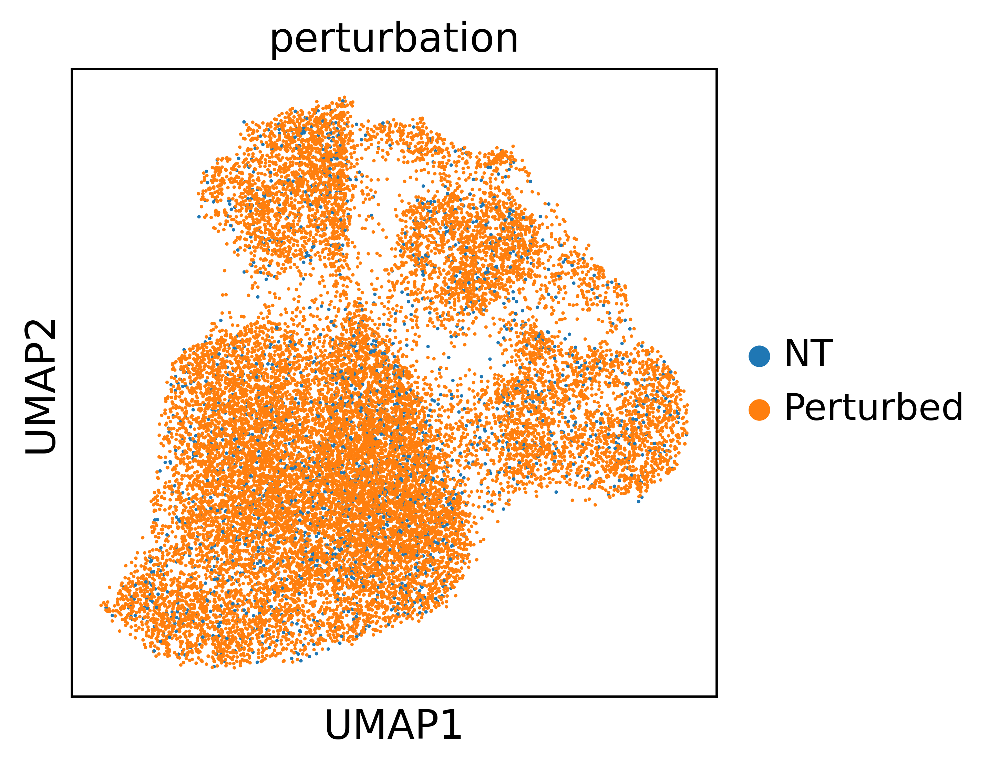

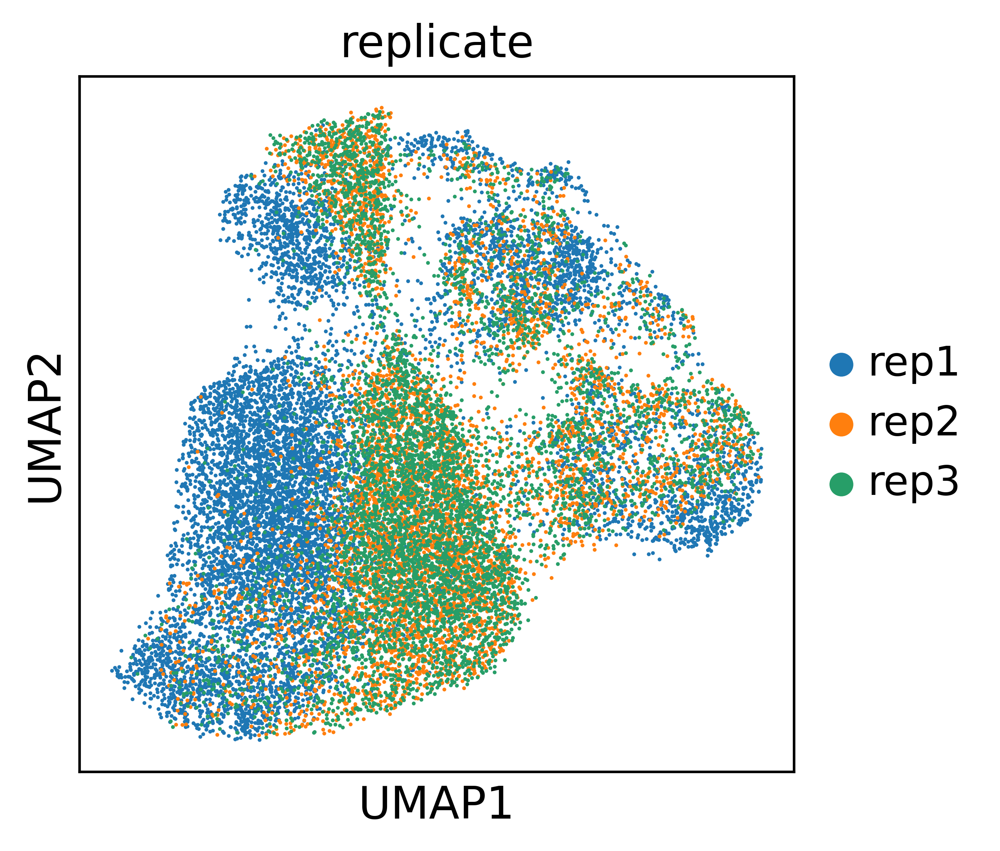

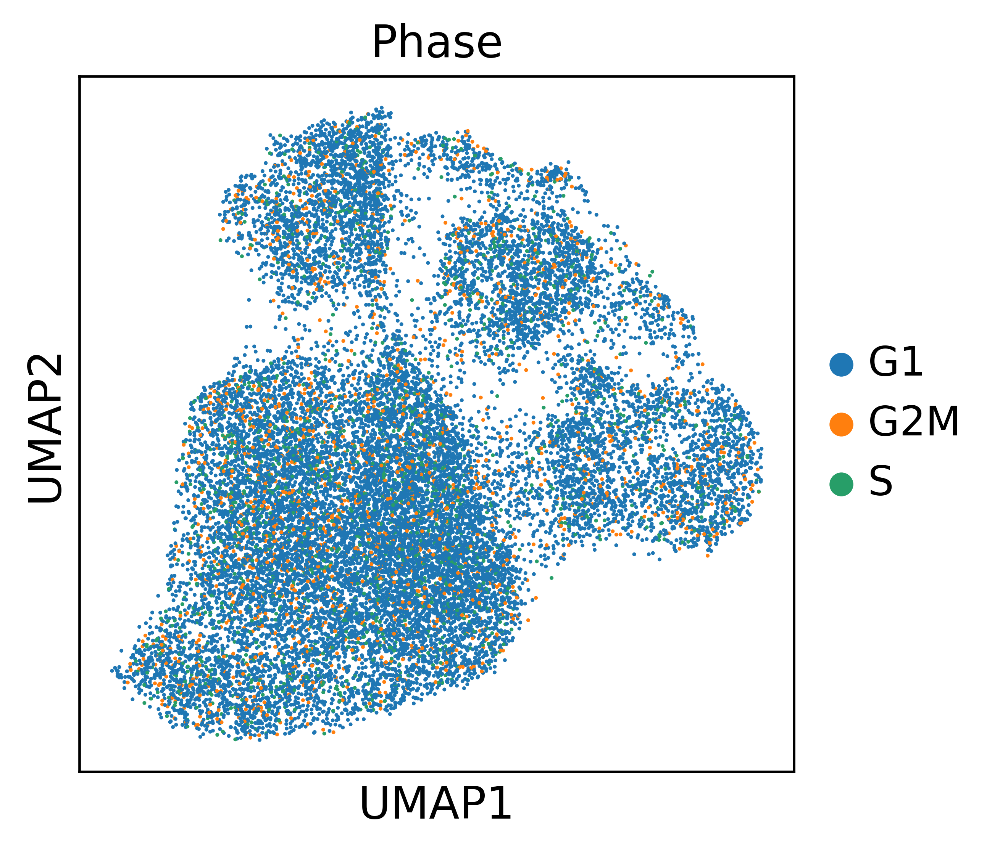

In [3]:
adata=sc.read_h5ad("../data/ECCITE.h5ad")
run_scdisinfact(adata=adata, batch_key='replicate', condition_key='perturbation', cell_type_label="Phase", dataset_name="ECCITE")

# ASD

https://singlecell.broadinstitute.org/single_cell/study/SCP1184/in-vivo-perturb-seq-reveals-neuronal-and-glial-abnormalities-associated-with-asd-risk-genes#study-download

Sanity check...
Finished.
Create scDisInFact datasets...


Finished.


Epoch 0, Validating Loss: 2.2794
	 loss reconstruction: 1.45490
	 loss kl comm: 0.11101
	 loss kl diff: 0.87825
	 loss mmd common: 5.06944
	 loss mmd diff: 28.29464
	 loss classification: 0.67601
	 loss group lasso diff: 0.13635
GPU memory usage: 0.000000MB


Epoch 10, Validating Loss: 1.0609
	 loss reconstruction: 0.38240
	 loss kl comm: 16.94537
	 loss kl diff: 2.44809
	 loss mmd common: 13.10453
	 loss mmd diff: 20.62496
	 loss classification: 0.55429
	 loss group lasso diff: 0.09616
GPU memory usage: 0.000000MB


Epoch 20, Validating Loss: 0.9930
	 loss reconstruction: 0.35900
	 loss kl comm: 30.87057
	 loss kl diff: 2.75030
	 loss mmd common: 23.96258
	 loss mmd diff: 19.84817
	 loss classification: 0.51716
	 loss group lasso diff: 0.08463
GPU memory usage: 0.000000MB


Epoch 30, Validating Loss: 0.9422
	 loss reconstruction: 0.33488
	 loss kl comm: 49.30523
	 loss kl diff: 2.94207
	 loss mmd common: 33.74731
	 loss mmd diff: 19.53018
	 loss classification: 0.48773
	 loss group lasso diff: 0.08438
GPU memory usage: 0.000000MB


Epoch 40, Validating Loss: 0.9023
	 loss reconstruction: 0.32595
	 loss kl comm: 53.81614
	 loss kl diff: 2.97653
	 loss mmd common: 31.64273
	 loss mmd diff: 17.75115
	 loss classification: 0.45184
	 loss group lasso diff: 0.08928
GPU memory usage: 0.000000MB


Epoch 50, Validating Loss: 0.8637
	 loss reconstruction: 0.32128
	 loss kl comm: 56.96321
	 loss kl diff: 3.17999
	 loss mmd common: 28.79172
	 loss mmd diff: 16.32269
	 loss classification: 0.40847
	 loss group lasso diff: 0.09702
GPU memory usage: 0.000000MB


Epoch 60, Validating Loss: 0.8238
	 loss reconstruction: 0.31587
	 loss kl comm: 63.65644
	 loss kl diff: 3.41491
	 loss mmd common: 29.18240
	 loss mmd diff: 16.79479
	 loss classification: 0.36295
	 loss group lasso diff: 0.10563
GPU memory usage: 0.000000MB


Epoch 70, Validating Loss: 0.7871
	 loss reconstruction: 0.31233
	 loss kl comm: 69.04237
	 loss kl diff: 3.64154
	 loss mmd common: 28.24977
	 loss mmd diff: 15.61980
	 loss classification: 0.32003
	 loss group lasso diff: 0.11327
GPU memory usage: 0.000000MB


Epoch 80, Validating Loss: 0.7473
	 loss reconstruction: 0.30906
	 loss kl comm: 75.37914
	 loss kl diff: 3.71059
	 loss mmd common: 29.85825
	 loss mmd diff: 14.16295
	 loss classification: 0.27644
	 loss group lasso diff: 0.11957
GPU memory usage: 0.000000MB


Epoch 90, Validating Loss: 0.7200
	 loss reconstruction: 0.30643
	 loss kl comm: 80.84106
	 loss kl diff: 4.01655
	 loss mmd common: 29.17658
	 loss mmd diff: 18.60702
	 loss classification: 0.24287
	 loss group lasso diff: 0.12498
GPU memory usage: 0.000000MB


Epoch 100, Validating Loss: 0.6947
	 loss reconstruction: 0.30408
	 loss kl comm: 90.58825
	 loss kl diff: 4.01228
	 loss mmd common: 28.42480
	 loss mmd diff: 19.16827
	 loss classification: 0.21565
	 loss group lasso diff: 0.12914
GPU memory usage: 0.000000MB


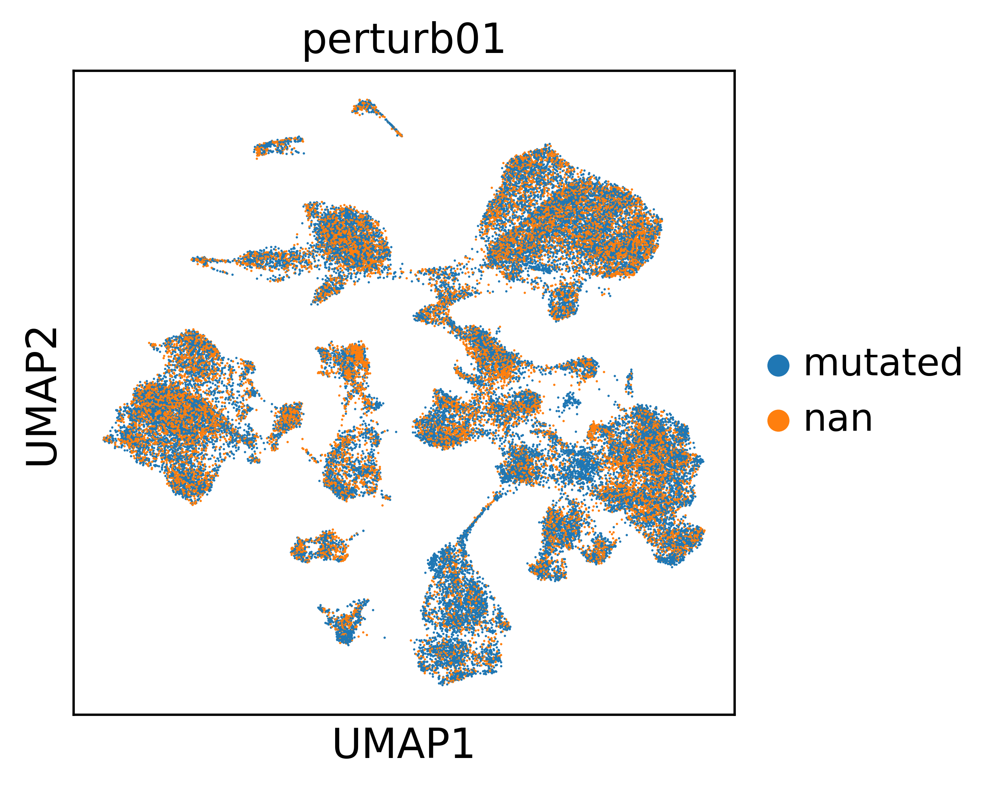

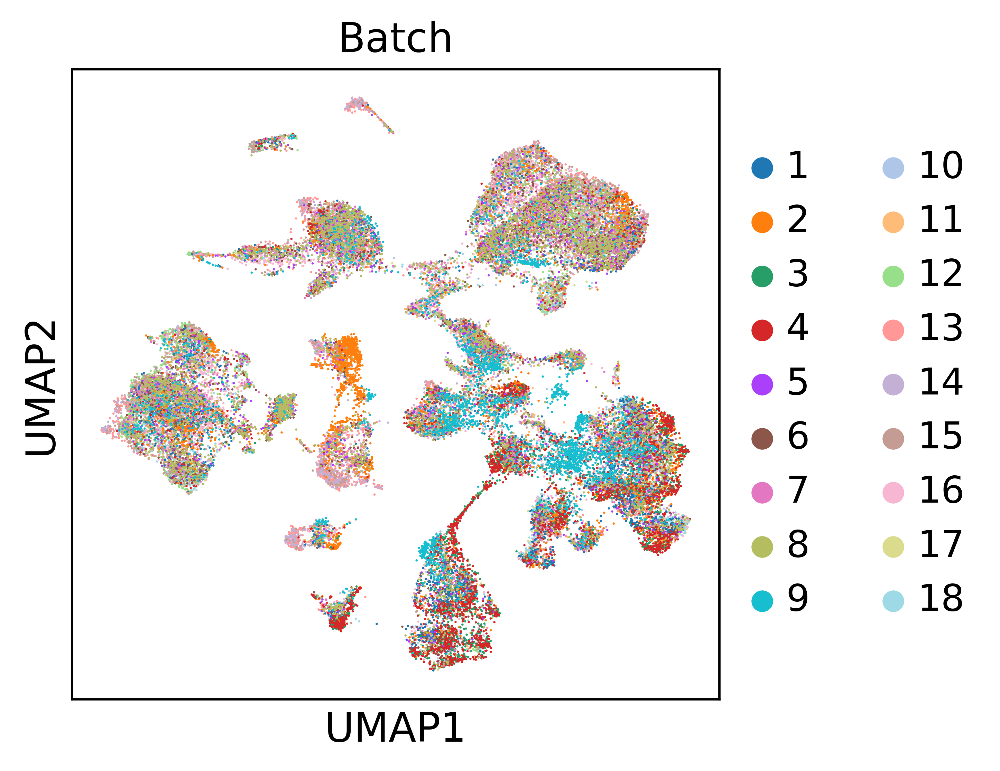

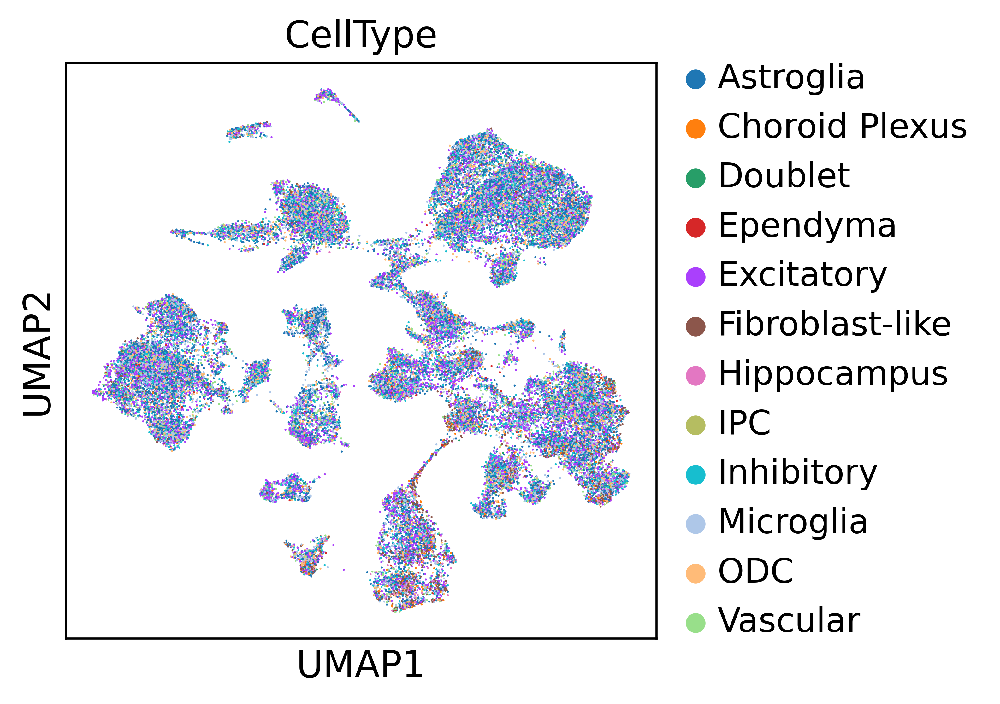

In [4]:
adata=sc.read_h5ad("../data/ASD.h5ad")
run_scdisinfact(adata=adata, batch_key='Batch', condition_key='perturb01', cell_type_label="CellType", dataset_name="ASD")

# ASD1

https://singlecell.broadinstitute.org/single_cell/study/SCP1184/in-vivo-perturb-seq-reveals-neuronal-and-glial-abnormalities-associated-with-asd-risk-genes#study-download

Sanity check...
Finished.
Create scDisInFact datasets...


Finished.


Epoch 0, Validating Loss: 2.3045
	 loss reconstruction: 1.42726
	 loss kl comm: 0.12590
	 loss kl diff: 0.63000
	 loss mmd common: 4.38585
	 loss mmd diff: 12.62464
	 loss classification: 0.73428
	 loss group lasso diff: 0.13494
GPU memory usage: 0.000000MB


Epoch 10, Validating Loss: 1.0855
	 loss reconstruction: 0.36051
	 loss kl comm: 17.27288
	 loss kl diff: 1.84635
	 loss mmd common: 8.25560
	 loss mmd diff: 10.75769
	 loss classification: 0.60777
	 loss group lasso diff: 0.09666
GPU memory usage: 0.000000MB


Epoch 20, Validating Loss: 1.0098
	 loss reconstruction: 0.34041
	 loss kl comm: 27.57096
	 loss kl diff: 2.16816
	 loss mmd common: 14.58609
	 loss mmd diff: 11.60854
	 loss classification: 0.55530
	 loss group lasso diff: 0.08955
GPU memory usage: 0.000000MB


Epoch 30, Validating Loss: 0.9561
	 loss reconstruction: 0.32184
	 loss kl comm: 39.57091
	 loss kl diff: 2.40736
	 loss mmd common: 26.31466
	 loss mmd diff: 11.78838
	 loss classification: 0.51294
	 loss group lasso diff: 0.09301
GPU memory usage: 0.000000MB


Epoch 40, Validating Loss: 0.8934
	 loss reconstruction: 0.30672
	 loss kl comm: 51.82649
	 loss kl diff: 2.73628
	 loss mmd common: 31.27906
	 loss mmd diff: 12.59018
	 loss classification: 0.45287
	 loss group lasso diff: 0.10155
GPU memory usage: 0.000000MB


Epoch 50, Validating Loss: 0.8393
	 loss reconstruction: 0.30252
	 loss kl comm: 55.35280
	 loss kl diff: 3.00810
	 loss mmd common: 30.18897
	 loss mmd diff: 13.98464
	 loss classification: 0.39037
	 loss group lasso diff: 0.11136
GPU memory usage: 0.000000MB


Epoch 60, Validating Loss: 0.7791
	 loss reconstruction: 0.29741
	 loss kl comm: 61.25611
	 loss kl diff: 3.38553
	 loss mmd common: 29.94367
	 loss mmd diff: 13.43367
	 loss classification: 0.32272
	 loss group lasso diff: 0.12016
GPU memory usage: 0.000000MB


Epoch 70, Validating Loss: 0.7417
	 loss reconstruction: 0.29469
	 loss kl comm: 65.44125
	 loss kl diff: 3.67186
	 loss mmd common: 28.99923
	 loss mmd diff: 12.23511
	 loss classification: 0.27870
	 loss group lasso diff: 0.12679
GPU memory usage: 0.000000MB


Epoch 80, Validating Loss: 0.7189
	 loss reconstruction: 0.29230
	 loss kl comm: 72.19928
	 loss kl diff: 3.84033
	 loss mmd common: 27.70082
	 loss mmd diff: 12.57008
	 loss classification: 0.25157
	 loss group lasso diff: 0.13188
GPU memory usage: 0.000000MB


Epoch 90, Validating Loss: 0.6894
	 loss reconstruction: 0.29066
	 loss kl comm: 78.78213
	 loss kl diff: 3.76278
	 loss mmd common: 25.11204
	 loss mmd diff: 14.89021
	 loss classification: 0.22043
	 loss group lasso diff: 0.13586
GPU memory usage: 0.000000MB


Epoch 100, Validating Loss: 0.6662
	 loss reconstruction: 0.28857
	 loss kl comm: 85.60886
	 loss kl diff: 4.04879
	 loss mmd common: 24.13934
	 loss mmd diff: 12.80913
	 loss classification: 0.19379
	 loss group lasso diff: 0.13876
GPU memory usage: 0.000000MB


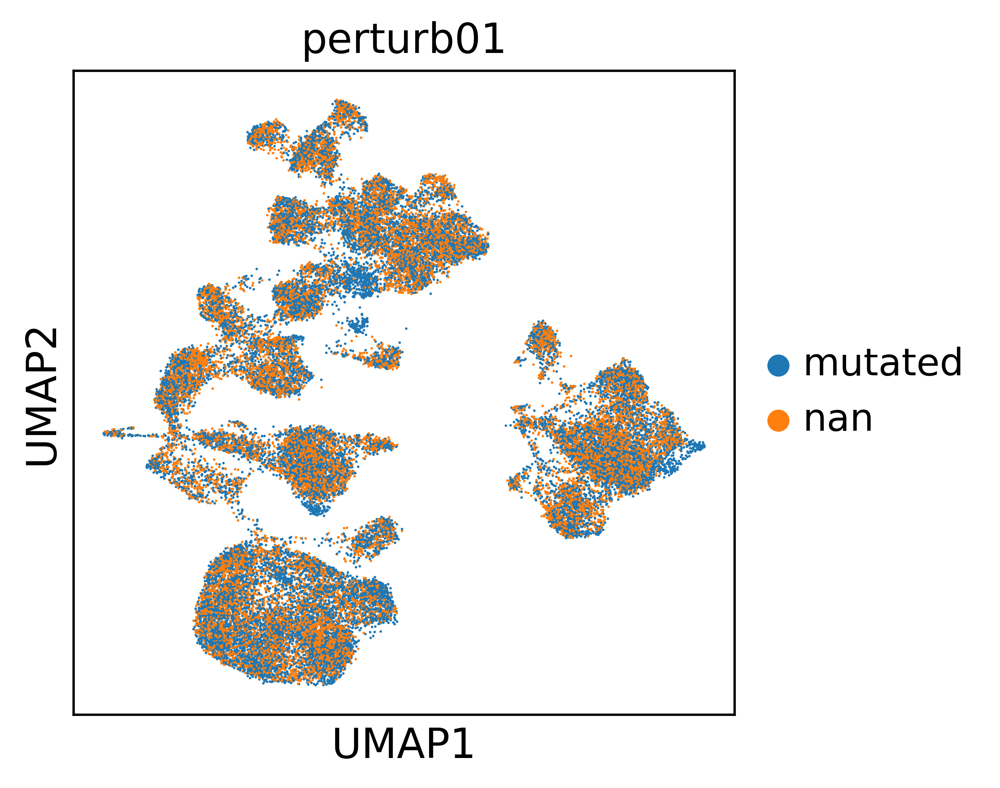

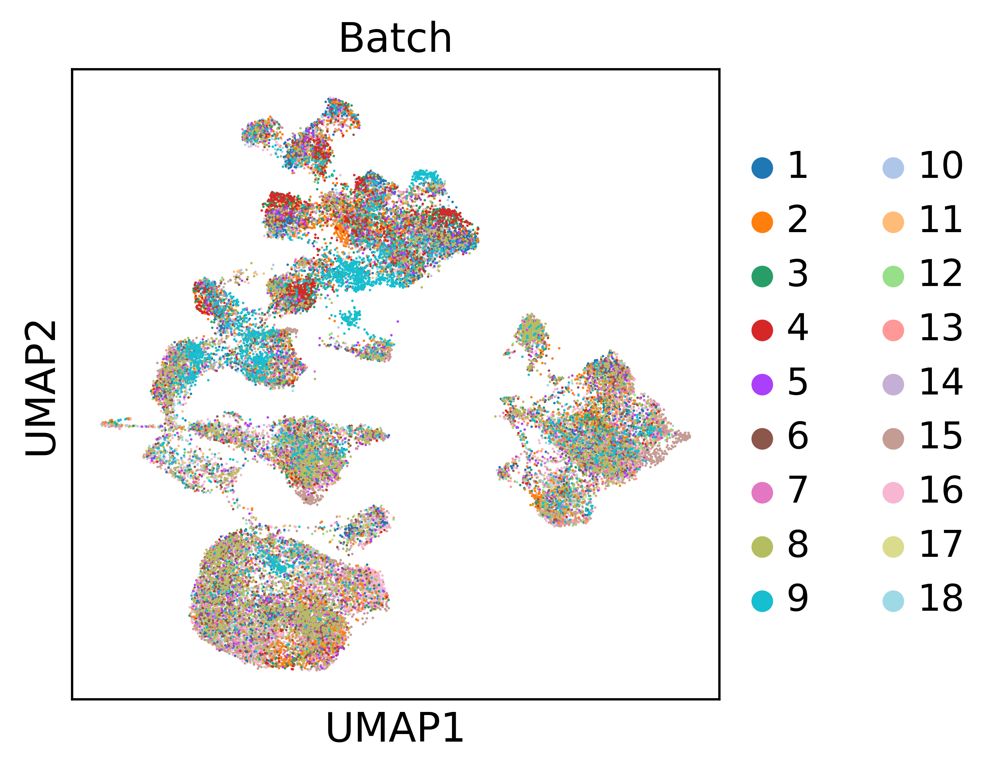

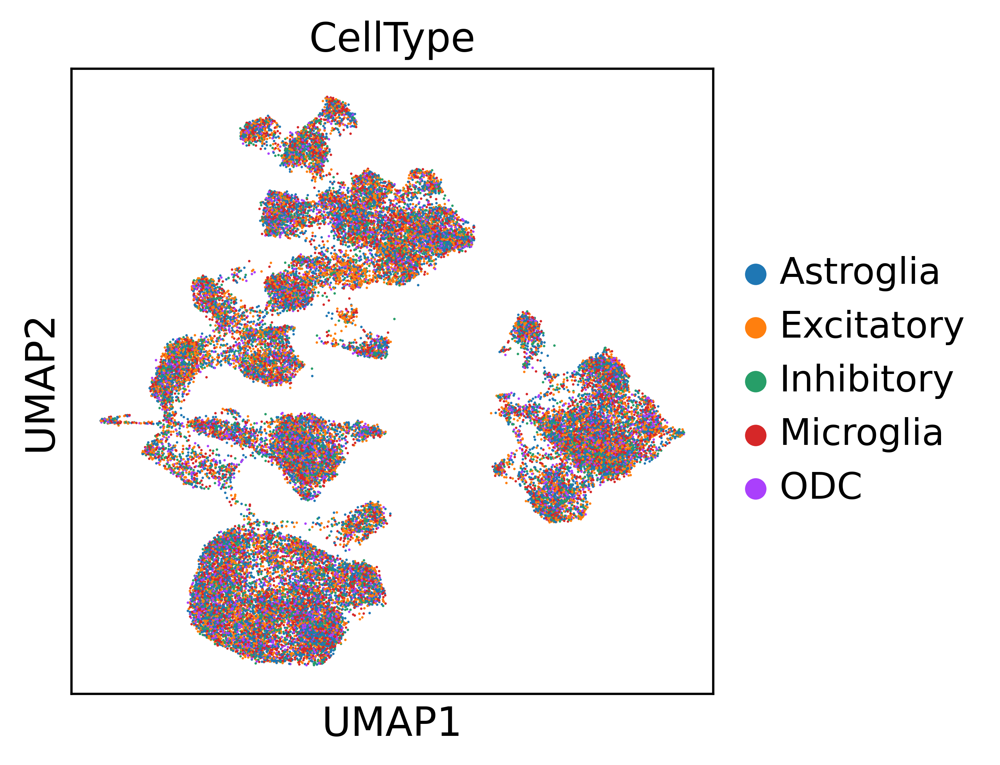

In [5]:
adata=sc.read_h5ad("../data/ASD1.h5ad")
run_scdisinfact(adata=adata, batch_key='Batch', condition_key='perturb01', cell_type_label="CellType", dataset_name="ASD1")